# Imports

In [1]:
# Data Processing
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from scipy import interpolate
import numpy as np

# General
import os
import simplejson as json
import time
import copy


In [2]:
# Custom tools

def fit_line(x, y):
    '''
    Fits a line to an input set of points

    Returns a tuple of the x and y components of the line

    Adapted from: https://stackoverflow.com/a/31800660/6454085
    '''
    return np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x))

def pad_with_zeros(a, new_length):
    '''
    Pads a 1D array with zeros

    If the array is less than the input length it will not be changed
    '''
    a = np.array(a)
    if a.shape[0] >= new_length:
        return a
    else:
        return np.pad(a, (0, new_length-a.shape[0]), mode='constant', constant_values=0)

def remap_array(a, low1, high1, low2, high2):
    '''
    Remaps a numpy array to a specific range
    '''
    return low2 + (high2 - low2) * (a - low1) / (high1 - low1)

def resample(x, n, kind='linear'):
    x = np.array(x)
    f = interpolate.interp1d(np.linspace(0, 1, x.size), x, kind)
    return f(np.linspace(0, 1, n))

    


# Firebase snapshot and other inputs

In [3]:
snapshot_folder = "firebase-snapshots"
snapshot_timestamp = 1598642923.545525
uids = ["dgb7CWy7rSNWIAZHXEYDRAt3O2b2", "6qW2fw5bT5hLvsAUO7MaR82ZqOu1", "3gz7ZfC2YVWEL83csaHrnHLqet42", "7TIOuYmg42MtgXKvf7YcfCYX9l52", "403NovdIENcvmKY9PoakqivpyP53", "pfZvthWm1iY4Cm11co2LgBEnimj1", "OEoHdni4GFXI6iKVbbW1pOGNXps2", "J2eQ4D9j9wVgj0oNOpZLWCenWnh1", "iTccwNLgo2OCqpG2BR565G1iUtA2"]


# Load data from Firebase
 The data is loaded from a .json file and converted into a pandas DataFrame, and a dictionary.
 For most of the processing we do, only the pandas dataframe [cycles_df] is necessary.
 It contains cycle-level data about:
 <br>
 - The start and end of a cycle
 - The control scheme that was used
 - The status of the cycle (incomplete or complete)
 - The pose (X, Y, and Theta) of the target

The dictionary [action_list] is organized by interfaceID, and contains all the action chains that made up cycles
It is used to calcuate specific data about specific actions (for example % of time spent orienting vs translating)


In [4]:

with open(os.path.join(snapshot_folder, str(snapshot_timestamp) + ".json")) as f:
    json_snapshot = json.load(f)

print("Loaded snapshot {}".format(time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(snapshot_timestamp))))


Loaded snapshot 2020-08-28 12:28:43


In [5]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


KeyError: 'isTest'

In [6]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    print(cycle)
                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


t Time)', 'timestamp': 1598594576949, 'type': 'pose'}, '-MFneMFokAzHgcNjQux3': {'date': 'Fri Aug 28 2020', 'eePose': {'theta': -145, 'x': 156, 'y': 100}, 'time': '01:02:57 GMT-0500 (Central Daylight Time)', 'timestamp': 1598594577460, 'type': 'pose'}, '-MFneMNVx8_j5REx2Zdl': {'date': 'Fri Aug 28 2020', 'eePose': {'theta': -145, 'x': 156, 'y': 100}, 'time': '01:02:57 GMT-0500 (Central Daylight Time)', 'timestamp': 1598594577952, 'type': 'pose'}, '-MFneMVGMO6tFj-_-zHQ': {'date': 'Fri Aug 28 2020', 'eePose': {'theta': -145, 'x': 156, 'y': 100}, 'time': '01:02:58 GMT-0500 (Central Daylight Time)', 'timestamp': 1598594578449, 'type': 'pose'}, '-MFneMc4kVP73r2eWjXs': {'date': 'Fri Aug 28 2020', 'eePose': {'theta': -145, 'x': 156, 'y': 100}, 'time': '01:02:58 GMT-0500 (Central Daylight Time)', 'timestamp': 1598594578949, 'type': 'pose'}, '-MFneMjtYvaw-CzJtl3J': {'date': 'Fri Aug 28 2020', 'eePose': {'theta': -145, 'x': 156, 'y': 100}, 'time': '01:02:59 GMT-0500 (Central Daylight Time)', 'time

KeyError: 'isTest'

In [7]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    print(cycle.keys())
                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control', 'endTime', 'events', 'isTest', 'startTime', 'status', 'targetPose', 'transitionType'])
dict_keys(['control

KeyError: 'isTest'

In [8]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


IndentationError: expected an indented block (<ipython-input-8-608d4881d5f9>, line 19)

In [9]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:
                        print(cid)

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


null


KeyError: 'isTest'

In [10]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:
                        print(cid, sid)

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


null -MFnczBo4VCXSldpngZV


KeyError: 'isTest'

In [11]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:
                        print(cid, sid, uid)

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


null -MFnczBo4VCXSldpngZV 3gz7ZfC2YVWEL83csaHrnHLqet42


KeyError: 'isTest'

In [12]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:
                        print(cid, sid, uid)
                        continue

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


null -MFnczBo4VCXSldpngZV 3gz7ZfC2YVWEL83csaHrnHLqet42
null -MFngmEYXI0X1-JTydNe 403NovdIENcvmKY9PoakqivpyP53
null -MFn_OOzfFxfZNOPT0fO 6qW2fw5bT5hLvsAUO7MaR82ZqOu1
null -MFnzYUt0XM7gh4z0CL3 7TIOuYmg42MtgXKvf7YcfCYX9l52
null -MFnwf-dbV3FtLYGjTfk J2eQ4D9j9wVgj0oNOpZLWCenWnh1
null -MFnfXqiNiJ6T2AYRYUk OEoHdni4GFXI6iKVbbW1pOGNXps2
null -MFnoOFfNXLAeSN_mbpC dgb7CWy7rSNWIAZHXEYDRAt3O2b2
null -MFnwM-nqJrcjThEb3ak iTccwNLgo2OCqpG2BR565G1iUtA2
null -MFnp4a9m3LmKKgirn7_ pfZvthWm1iY4Cm11co2LgBEnimj1


In [13]:
# [interfaceIDs] is a set that contains one of each ID
# We use it later on to sparate the dataframe by interface
interfaceIDs = set()

cycle_data_columns = ["startTime", "endTime", "status", "control", "transitionType", "interfaceID", "targetX", "targetY", "targetTheta", "threshXY", "threshTheta"]
cycle_data = []

action_list = {}

for uid in json_snapshot:
    if uid in uids:
        for sid in json_snapshot[uid]['sessions']:
            if 'cycles' in json_snapshot[uid]['sessions'][sid]:
                for cid in json_snapshot[uid]['sessions'][sid]['cycles']:
                    cycle = json_snapshot[uid]['sessions'][sid]['cycles'][cid]
                    
                    if 'isTest' not in cycle:
                        print(cid, sid, uid)
                        continue

                    if cycle['isTest']:
                        # Update cycle_data with general information about the cycle
                        startTime = cycle['startTime']['timestamp'] / 1000
                        status = cycle['status']

                        # There is no end timestamp if the cycle is incomplete
                        endTime = startTime
                        if status == "complete":
                            endTime = cycle['endTime']['timestamp'] / 1000

                        control = cycle['control']
                        transitionType = cycle['transitionType']
                        interfaceID = control + "." +transitionType

                        interfaceIDs.add(interfaceID)

                        targetX = cycle['targetPose']['x']
                        targetY = cycle['targetPose']['y']
                        targetTheta = cycle['targetPose']['theta']
                        threshXY = cycle['targetPose']['threshXY']
                        threshTheta = cycle['targetPose']['threshTheta']

                        cycle_data.append([startTime, endTime, status, control, transitionType, interfaceID, targetX, targetY, targetTheta, threshXY, threshTheta])

                        # Update action_list with the set of actions for this cycle
                        if 'events' in cycle: # Sometimes the last cycle of a session has no action so we skip it
                            actions = []
                            for aid in cycle['events']:

                                # We want to ignore any events that are just ee pose logs, and only keep user actions
                                if cycle['events'][aid]['type'] != 'pose':
                                    # We want to remove any actions that are just a release of the cursor
                                    action_type = cycle['events'][aid]['newState']
                                    if action_type != "cursor-free":
                                        actions.append(action_type)
                                    elif interfaceID == "target.click" or interfaceID == "targetdrag.click":
                                        actions.append(action_type)
                            
                            if interfaceID in action_list:
                                action_list[interfaceID].append(actions)
                            else:
                                action_list[interfaceID] = [actions]


null -MFnczBo4VCXSldpngZV 3gz7ZfC2YVWEL83csaHrnHLqet42
null -MFngmEYXI0X1-JTydNe 403NovdIENcvmKY9PoakqivpyP53
null -MFn_OOzfFxfZNOPT0fO 6qW2fw5bT5hLvsAUO7MaR82ZqOu1
null -MFnzYUt0XM7gh4z0CL3 7TIOuYmg42MtgXKvf7YcfCYX9l52
null -MFnwf-dbV3FtLYGjTfk J2eQ4D9j9wVgj0oNOpZLWCenWnh1
null -MFnfXqiNiJ6T2AYRYUk OEoHdni4GFXI6iKVbbW1pOGNXps2
null -MFnoOFfNXLAeSN_mbpC dgb7CWy7rSNWIAZHXEYDRAt3O2b2
null -MFnwM-nqJrcjThEb3ak iTccwNLgo2OCqpG2BR565G1iUtA2
null -MFnp4a9m3LmKKgirn7_ pfZvthWm1iY4Cm11co2LgBEnimj1


In [14]:
cycles_df = pd.DataFrame(cycle_data, columns=cycle_data_columns)
cycles_df['cycleLength'] = cycles_df['endTime'] - cycles_df['startTime']
# Calculate the euclidean distace between where the ee starts (357, 249) and the target
cycles_df['targetDistance'] = ((cycles_df['targetX'] - 357) ** 2 + (cycles_df['targetY'] - 249) ** 2) ** 0.5
cycles_df = cycles_df[cycles_df["status"] == "complete"]

interface_dfs = {}
for interfaceID in interfaceIDs:
    interface_dfs[interfaceID] = cycles_df[cycles_df["interfaceID"] == interfaceID]

cycles_df.head()


,startTime,endTime,status,control,transitionType,interfaceID,targetX,targetY,targetTheta,threshXY,threshTheta,cycleLength,targetDistance
0,1.598594e+09,1.598594e+09,complete,arrow,press/release,arrow.press/release,215.760637,287.660998,-91.244611,6.481722,18.490128,7.214,146.435072
1,1.598594e+09,1.598594e+09,complete,arrow,press/release,arrow.press/release,486.182266,110.368199,-66.768103,11.092679,27.856812,10.754,189.490987
2,1.598594e+09,1.598594e+09,complete,arrow,press/release,arrow.press/release,342.815026,236.257381,137.295334,5.607670,21.580728,7.423,19.067980
3,1.598594e+09,1.598594e+09,complete,arrow,press/release,arrow.press/release,400.713027,203.155867,-78.159548,16.038832,36.126657,13.842,63.344402
4,1.598594e+09,1.598594e+09,complete,arrow,press/release,arrow.press/release,227.139894,132.545095,105.848398,11.918518,41.132143,6.800,174.428759


# Time stats per interface

In [15]:
for interfaceID in interface_dfs:
    interface_df = interface_dfs[interfaceID]

    print(interfaceID)
    print("Mean:", np.mean(interface_df['cycleLength']))
    print("Standard Deviation:",np.std(interface_df['cycleLength']))
    print("Min:",np.min(interface_df['cycleLength']))
    print("Max:",np.max(interface_df['cycleLength']))
    print()



targetdrag.press/release
Mean: 2.2393889096048145
Standard Deviation: 0.6485916797025902
Min: 1.2899999618530273
Max: 4.635999917984009

arrow.click
Mean: 18.392499993244808
Standard Deviation: 7.8027876541220245
Min: 6.650000095367432
Max: 48.27499985694885

arrow.press/release
Mean: 11.079375008742014
Standard Deviation: 5.618686601083696
Min: 3.2950000762939453
Max: 43.58500003814697

targetdrag.click
Mean: 2.711499982410007
Standard Deviation: 1.192137384652982
Min: 1.930999994277954
Max: 8.248000144958496

drag.click
Mean: 11.043805572721693
Standard Deviation: 7.269262311581689
Min: 3.674999952316284
Max: 42.699000120162964

drag.press/release
Mean: 9.263633346557617
Standard Deviation: 4.171449528917629
Min: 3.626000165939331
Max: 20.986999988555908

panel.click
Mean: 9.368999979712747
Standard Deviation: 3.4085565978321584
Min: 1.819000005722046
Max: 15.38699984550476



# Time vs. Distance (Euclidean, Orientation, and Combined)
## Euclidean Distance vs Time

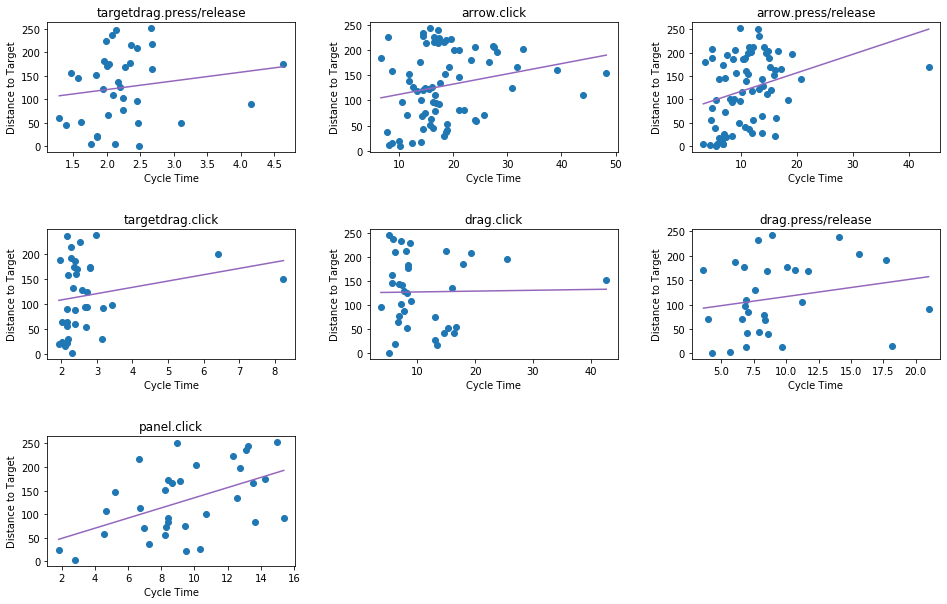

In [16]:
fig = plt.figure(figsize=(16,10))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, interfaceID in enumerate(interface_dfs):
    ax = plt.subplot("33"+str(i+1))
    ax.set_title(interfaceID)
    
    interface_df = interface_dfs[interfaceID]
    ax.scatter(interface_df['cycleLength'], interface_df['targetDistance'], c="tab:blue")
    
    line = fit_line(interface_df['cycleLength'], interface_df['targetDistance'])
    ax.plot(line[0], line[1], c="tab:purple")

    ax.set_xlabel('Cycle Time')
    ax.set_ylabel('Distance to Target')


## Orientation vs Time

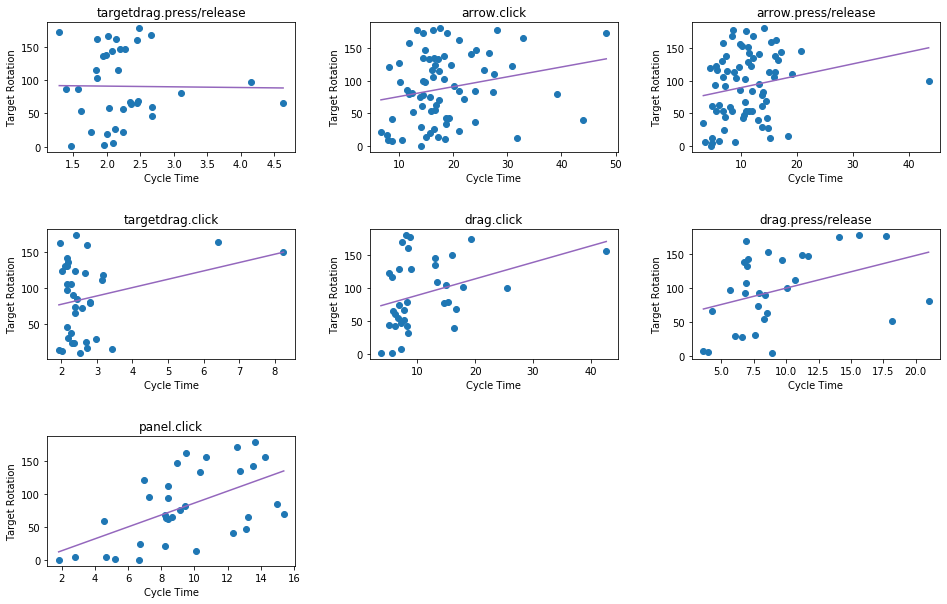

In [17]:
fig = plt.figure(figsize=(16,10))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, interfaceID in enumerate(interface_dfs):
    ax = plt.subplot("33"+str(i+1))
    ax.set_title(interfaceID)
    
    interface_df = interface_dfs[interfaceID]
    ax.scatter(interface_df['cycleLength'], np.abs(interface_df['targetTheta']), c="tab:blue")
    
    line = fit_line(interface_df['cycleLength'], np.abs(interface_df['targetTheta']))
    ax.plot(line[0], line[1], c="tab:purple")

    ax.set_xlabel('Cycle Time')
    ax.set_ylabel('Target Rotation')


## Distance + Orientation vs Time

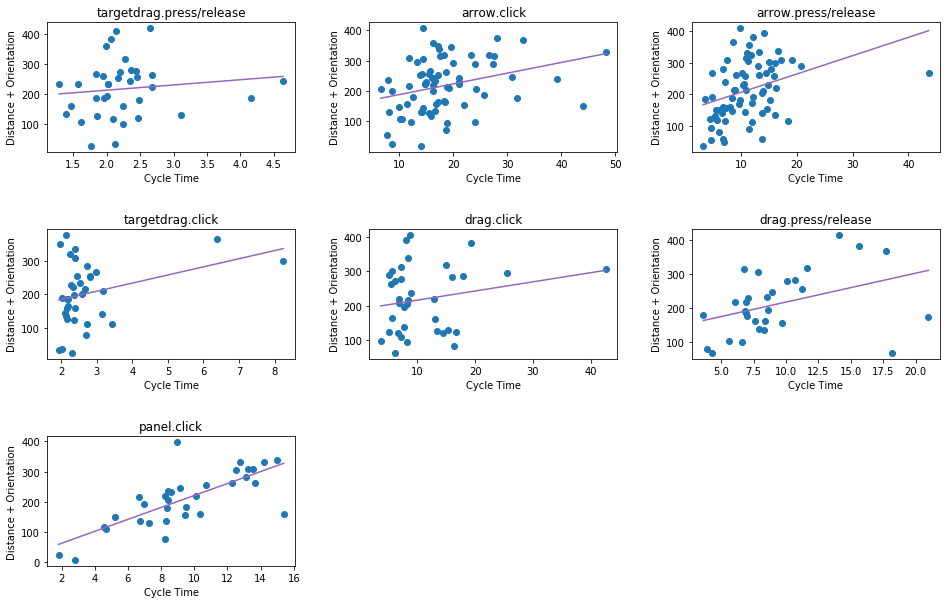

In [18]:

fig = plt.figure(figsize=(16,10))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, interfaceID in enumerate(interface_dfs):
    ax = plt.subplot("33"+str(i+1))
    ax.set_title(interfaceID)
    
    interface_df = interface_dfs[interfaceID]
    ax.scatter(interface_df['cycleLength'], np.abs(interface_df['targetTheta']) + interface_df['targetDistance'], c="tab:blue")
    
    line = fit_line(interface_df['cycleLength'], np.abs(interface_df['targetTheta']) + interface_df['targetDistance'])
    ax.plot(line[0], line[1], c="tab:purple")

    ax.set_xlabel('Cycle Time')
    ax.set_ylabel('Distance + Orientation')


# Action stats per interface
## Action Type vs Time

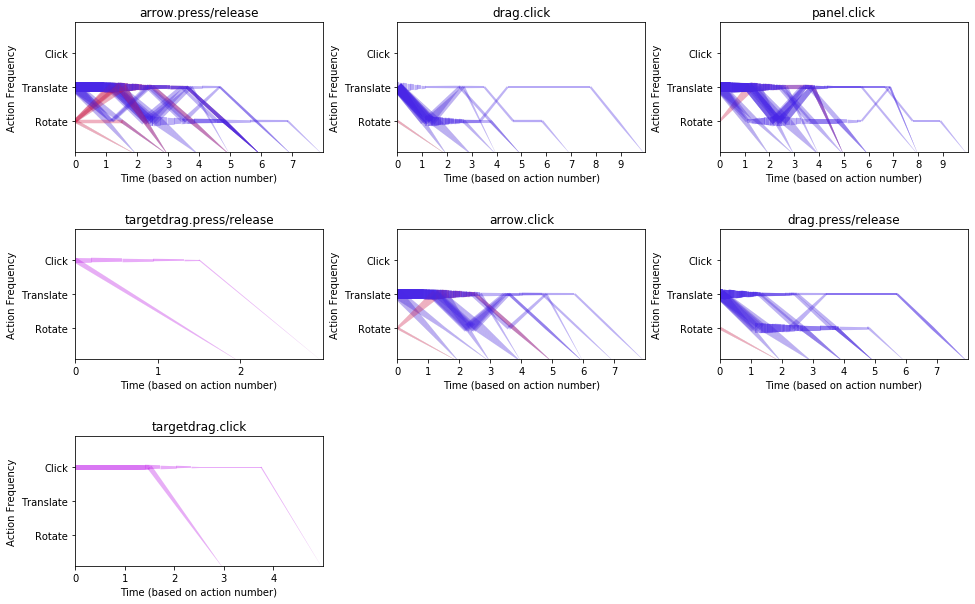

In [19]:
sample_num = 1000

fig = plt.figure(figsize=(16,10))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, interfaceID in enumerate(action_list):
    rotation = np.array([])
    translation = np.array([])
    click = np.array([])
    for cycle in action_list[interfaceID]:
        for j, action in enumerate(cycle):
            
            if "rotating" in action:
                rotation = pad_with_zeros(rotation, j+1)
                rotation[j] += 1
            elif "translating" in action or "moving" in action:
                translation = pad_with_zeros(translation, j+1)
                translation[j] += 1
            elif "cursor" in action:
                click = pad_with_zeros(click, j+1)
                click[j] += 1
    
    if rotation.shape[0] != 0:
        rotation = remap_array(rotation, np.min(rotation), np.max(rotation), 2, 10)
    if translation.shape[0] != 0:
        translation = remap_array(translation, np.min(translation), np.max(translation), 2, 10)
    if click.shape[0] != 0:
        click = remap_array(click, np.min(click), np.max(click), 1, 5)

    ax = plt.subplot("33"+str(i+1))
    ax.set_title(interfaceID)

    drawn_lines = []

    for cycle in action_list[interfaceID]:
        numbered_cycle = []
        cycle_width = []
        for i, action in enumerate(cycle):
            if "rotating" in action:
                numbered_cycle.append(1)
                cycle_width.append(rotation[i])
            elif "translating" in action or "moving" in action:
                numbered_cycle.append(2)
                cycle_width.append(translation[i])
            elif "cursor" in action:
                numbered_cycle.append(3)
                cycle_width.append(click[i])
        
        drawn = False
        for line in drawn_lines:
            drawn = np.array_equal(numbered_cycle, line)
            if drawn: break
        if drawn: continue
        drawn_lines.append(copy.copy(numbered_cycle))
        
        numbered_cycle.append(0)
        cycle_width.append(0)

        color = np.array([])
        alpha = 100
        if numbered_cycle[0] == 1:
            color = np.array([214, 33, 79, alpha])
        elif numbered_cycle[0] == 2:
            color = np.array([73, 39, 230, alpha])
        elif numbered_cycle[0] == 3:
            color = np.array([193, 24, 237, alpha])
        
        cycle_len = len(numbered_cycle)
        y = resample(numbered_cycle, sample_num, kind='slinear')
        lwidths = resample(cycle_width, sample_num, kind='slinear')

        x = np.linspace(0, cycle_len, sample_num)
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, linewidths=lwidths, color=color/255)
        ax.add_collection(lc)

    ax.set_xlabel('Time (based on action number)')
    ax.set_ylabel('Action Frequency')

    # The axis limits are not (0, 4) becase we don't want to see those labels
    ax.set_ylim([0.1, 3.9])
    ax.set_xlim([0, max(rotation.shape[0], translation.shape[0], click.shape[0])+1])

    # Lable the ticks
    ax.set_yticklabels(['','Rotate','Translate', 'Click'])

    # Force the x-axis tick interval to be 1
    start, end = ax.get_xlim()
    ax.xaxis.set_ticks(np.arange(start, end, 1))
